In [3773]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Configure Notebook
%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_context("notebook")
import warnings
warnings.filterwarnings('ignore')
import geopandas as gpd



In [3774]:

# Replace 'your_file.shp' with the path to your shapefile
#shapefile_path = r'C:\Users\amoore\Downloads\GIS_Data_-_Future_Transit_Network_-_2023-05-12\RTP_POINTS.shp'

# Read the shapefile
gdf_points= gpd.read_file('RTP_POINTS.shp')

print(gdf_points.columns)

Index(['LOCATION_N', 'STATUS', 'TECHNOLOGY', 'NAME', 'geometry'], dtype='object')


In [3775]:
gdf_points

,LOCATION_N,STATUS,TECHNOLOGY,NAME,geometry
0,Creditstone,Existing,BRT,Highway 7 West BRT,POINT (303369.273 4850639.811)
1,Keele,Existing,BRT,Highway 7 West BRT,POINT (304847.452 4851150.715)
2,Davis,In Delivery,BRT,Yonge North BRT,POINT (306373.949 4879421.963)
3,Eagle,Existing,BRT,Yonge North BRT,POINT (306550.211 4878383.22)
4,Mulock,Existing,BRT,Yonge North BRT,POINT (306720.789 4877366.807)
...,...,...,...,...,...
382,St. Marys,Existing,GO Rail,Kitchener,POINT (171712.316 4790417.363)
383,London,Existing,GO Rail,Kitchener,POINT (162040.578 4761503.364)
384,Milton-Trafalgar,Proposed,GO Rail,Milton,POINT (279034.513 4824823.447)
385,Beamsville,Proposed,GO Rail,Lakeshore West,POINT (307028.973 4782332.52)


In [3776]:
gdf_points['STATUS'].unique()


array(['Existing', 'In Delivery', 'Proposed', 'Advancing'], dtype=object)

In [3777]:
gdf_points['NAME'].unique()

array(['Highway 7 West BRT', 'Yonge North BRT', 'Yonge South BRT',
       'Davis Drive BRT', 'Highway 7 East BRT', 'Eglinton Crosstown LRT',
       'Line 2: Bloor-Danforth Subway', 'Line 1: Yonge-University Subway',
       'Line 4: Sheppard Subway', 'Line 3: Scarborough RT',
       'Scarborough Subway Extension', 'UP Express',
       'Hamilton B-Line LRT', 'Hazel McCallion Line',
       'Mississauga Transitway', 'Finch West LRT', 'Lakeshore East',
       'Richmond Hill', 'Stouffville', 'Kitchener', 'Barrie', 'Milton',
       'Lakeshore West', 'ALL', 'Niagara Falls',
       'Lakeshore East and Stouffville', 'Yonge North Subway Extension',
       'Eglinton Crosstown West Extension', 'Eglinton East LRT',
       'Ontario Line', 'ION LRT', 'ION LRT (Stage 2)'], dtype=object)

In [3778]:
gdf_points['TECHNOLOGY'].unique()

array(['BRT', 'LRT', 'Subway', 'Subway (To Be Removed)',
       'UP Express - 15-Min', 'GO Rail'], dtype=object)

In [3779]:
#Replace any existing (to be removed) technology category to 'obsolete' to be able to filter it out
gdf_points.replace('Subway (To Be Removed)', 'Obsolete', inplace=True)


In [3780]:
gdf_points.crs

<Projected CRS: EPSG:2952>
Name: NAD83(CSRS) / MTM zone 10
Axis Info [cartesian]:
- E(X)[east]: Easting (metre)
- N(Y)[north]: Northing (metre)
Area of Use:
- name: Canada - Quebec west of 78°W; Canada - Ontario - between 79°30'W and 78°W in area to north of 47°N; between 80°15'W and 78°W in area between 46°N and 47°N; between 81°W and 78°W in area south of 46°N.
- bounds: (-81.0, 42.26, -78.0, 62.45)
Coordinate Operation:
- name: MTM zone 10
- method: Transverse Mercator
Datum: NAD83 Canadian Spatial Reference System
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [3781]:
# Read the shapefile
gdf_network = gpd.read_file('RTP_TRANSIT_NETWORK.shp')

print(gdf_network.head())
print(gdf_network.columns)


     STATUS    TECHNOLOGY                      NAME  Shape_Leng   
0  Proposed  Priority Bus                     Bayly    12759.27  \
1  Proposed     LRT / BRT                Simcoe BRT    10223.30   
2  Proposed  Priority Bus           Trafalgar North     8333.62   
3  Proposed  Priority Bus                     Brant     6397.39   
4  Proposed  Priority Bus  Hamilton Mohawk (T-Line)    20928.69   

                                            geometry  
0  LINESTRING (338248.502 4854736.031, 338312.491...  
1  MULTILINESTRING ((354663.722 4866048.782, 3559...  
2  LINESTRING (279034.513 4824823.447, 279921.981...  
3  MULTILINESTRING ((279236.752 4799765.718, 2792...  
4  LINESTRING (264999.178 4786732.487, 265550.398...  
Index(['STATUS', 'TECHNOLOGY', 'NAME', 'Shape_Leng', 'geometry'], dtype='object')


In [3782]:
gdf_network

,STATUS,TECHNOLOGY,NAME,Shape_Leng,geometry
0,Proposed,Priority Bus,Bayly,12759.27,"LINESTRING (338248.502 4854736.031, 338312.491..."
1,Proposed,LRT / BRT,Simcoe BRT,10223.30,"MULTILINESTRING ((354663.722 4866048.782, 3559..."
2,Proposed,Priority Bus,Trafalgar North,8333.62,"LINESTRING (279034.513 4824823.447, 279921.981..."
3,Proposed,Priority Bus,Brant,6397.39,"MULTILINESTRING ((279236.752 4799765.718, 2792..."
4,Proposed,Priority Bus,Hamilton Mohawk (T-Line),20928.69,"LINESTRING (264999.178 4786732.487, 265550.398..."
...,...,...,...,...,...
122,Proposed,Priority Bus,Maple Grove,20236.74,"LINESTRING (238128.435 4806155.86, 238273.58 4..."
123,Proposed,LRT / BRT,ION Victoria BRT (Stage 3),14233.48,"LINESTRING (230807.054 4815803.767, 230797.007..."
124,Proposed,LRT / BRT,ION Erb / University / King BRT (Stage 3),9828.35,"LINESTRING (218910.453 4811203.892, 218980.75 ..."
125,Existing (To Be Removed),Priority Bus,ION Cambridge Bus,18234.15,"LINESTRING (228512.532 4809598.38, 228628.529 ..."


In [3783]:
gdf_network['STATUS'].unique()


array(['Proposed', 'In Delivery', 'Existing', 'Advancing',
       'Existing (To Be Removed)'], dtype=object)

In [3784]:
gdf_network['TECHNOLOGY'].unique()


array(['Priority Bus', 'LRT / BRT', 'Subway', 'GO Rail - 15-min',
       'GO Rail - All-day', 'GO Rail - Peak Only',
       'GO Rail - Peak & Limited Off-Peak'], dtype=object)

In [3785]:
gdf_network.crs

<Projected CRS: EPSG:2952>
Name: NAD83(CSRS) / MTM zone 10
Axis Info [cartesian]:
- E(X)[east]: Easting (metre)
- N(Y)[north]: Northing (metre)
Area of Use:
- name: Canada - Quebec west of 78°W; Canada - Ontario - between 79°30'W and 78°W in area to north of 47°N; between 80°15'W and 78°W in area between 46°N and 47°N; between 81°W and 78°W in area south of 46°N.
- bounds: (-81.0, 42.26, -78.0, 62.45)
Coordinate Operation:
- name: MTM zone 10
- method: Transverse Mercator
Datum: NAD83 Canadian Spatial Reference System
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

#### Geospatial data filtering and viewing

In [3786]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [3787]:
import folium
import requests
import pandas as pd

geojson_url = 'https://services3.arcgis.com/b9WvedVPoizGfvfD/arcgis/rest/services/City_Ward_2018/FeatureServer/0/query?returnGeometry=true&where=1%3D1&outSr=4326&outFields=*&inSr=4326&geometry=&geometryType=esriGeometryEnvelope&spatialRel=esriSpatialRelIntersects&geometryPrecision=6&f=geojson'

# Create a map centered on Toronto
map_toronto = folium.Map(location=[43.7, -79.42], zoom_start=10)

# Fetch the GeoJSON data
geojson_data = requests.get(geojson_url).json()

folium.GeoJson(
    geojson_data,
    name="Toronto Wards",
    popup=folium.GeoJsonPopup(fields=["AREA_NAME"], aliases=["Ward Name:"]),
    style_function=lambda feature: {
        'fillColor': '#134d6e',
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.5
    }
).add_to(map_toronto)

map_toronto

In [3788]:
#check the coordinate reference system of the map
map_toronto.crs

'EPSG3857'

#### Convert Metrolinx shapefiles from EPSG2952 to EPSG4326 to be able to view it in folium

In [3789]:
gdf_points = gdf_points.to_crs(epsg=4326)
gdf_network = gdf_network.to_crs(epsg=4326)

##### Create a dataframe for the wards to use them as bounds and filter the stations we want to analyze.

In [3790]:
gdf_wards = gpd.read_file(geojson_url)
gdf_wards.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [3791]:
gdf_wards.head()

,OBJECTID,AREA_ID,DATE_EFFECTIVE,DATE_EXPIRY,AREA_ATTR_ID,AREA_TYPE_ID,PARENT_AREA_ID,AREA_TYPE,AREA_CLASS_ID,AREA_CLASS,...,FEATURE_CODE_DESC,TRANS_ID_CREATE,TRANS_ID_EXPIRE,X,Y,LONGITUDE,LATITUDE,Shape__Area,Shape__Length,geometry
0,1,2457716,1533665466000,32503698000000,25993172,876,None,WD18,634,WD18,...,None,279754,-1,313874.84,4832657.47,-79.39,43.64,35724988.10,38154.01,"POLYGON ((-79.38377 43.65572, -79.3832 43.6543..."
1,2,2457718,1533665466000,32503698000000,25993174,876,None,WD18,634,WD18,...,None,279754,-1,305318.58,4839222.66,-79.49,43.69,47806849.89,34743.04,"POLYGON ((-79.46884 43.70609, -79.46856 43.704..."
2,3,2457719,1533665466000,32503698000000,25993175,876,None,WD18,634,WD18,...,None,279754,-1,315261.15,4835363.78,-79.37,43.66,11207623.60,14955.58,"POLYGON ((-79.37714 43.67315, -79.37654 43.673..."
3,4,2457720,1533665466000,32503698000000,25993176,876,None,WD18,634,WD18,...,None,279754,-1,309296.33,4836380.23,-79.44,43.67,23129537.34,24053.52,"POLYGON ((-79.44642 43.68625, -79.44612 43.685..."
4,5,2457721,1533665466000,32503698000000,25993177,876,None,WD18,634,WD18,...,None,279754,-1,318237.29,4844209.31,-79.33,43.74,44017195.45,30861.52,"POLYGON ((-79.3195 43.71563, -79.32007 43.7155..."


##### Create a spatial join to filter the transit points and networks within Toronto area only.

In [3792]:
gdf_points_toronto = gpd.sjoin(gdf_points, gdf_wards, how="inner", predicate="within")
gdf_points_toronto.head()

,LOCATION_N,STATUS,TECHNOLOGY,NAME,geometry,index_right,OBJECTID,AREA_ID,DATE_EFFECTIVE,DATE_EXPIRY,...,FEATURE_CODE,FEATURE_CODE_DESC,TRANS_ID_CREATE,TRANS_ID_EXPIRE,X,Y,LONGITUDE,LATITUDE,Shape__Area,Shape__Length
38,Avenue,In Delivery,LRT,Eglinton Crosstown LRT,POINT (-79.40851 43.70461),24,25,2457723,1533665466000,32503698000000,...,None,None,279754,-1,310114.45,4841820.39,-79.43,43.72,43408565.04,28792.59
39,Forest Hill,In Delivery,LRT,Eglinton Crosstown LRT,POINT (-79.42557 43.70103),24,25,2457723,1533665466000,32503698000000,...,None,None,279754,-1,310114.45,4841820.39,-79.43,43.72,43408565.04,28792.59
40,Leaside,In Delivery,LRT,Eglinton Crosstown LRT,POINT (-79.37716 43.71105),11,12,2457729,1533665466000,32503698000000,...,None,None,279754,-1,314825.88,4842945.66,-79.38,43.73,58045107.80,37529.16
41,Sloane,In Delivery,LRT,Eglinton Crosstown LRT,POINT (-79.31352 43.72598),4,5,2457721,1533665466000,32503698000000,...,None,None,279754,-1,318237.29,4844209.31,-79.33,43.74,44017195.45,30861.52
42,Birchmount,In Delivery,LRT,Eglinton Crosstown LRT,POINT (-79.27791 43.73007),13,14,2457731,1533665466000,32503698000000,...,None,None,279754,-1,322773.61,4845666.75,-79.28,43.75,54085581.89,31081.39


In [3793]:
# create small circles for each station and include a popup with information about the station
for _, row in gdf_points_toronto.iterrows():
    # Extract latitude and longitude from the geometry (point)
    lat, lon = row.geometry.y, row.geometry.x
    
    # Set color based on the 'STATUS' column
    if row['TECHNOLOGY'] == 'Obsolete':
        color = 'grey'  # purple for stations advancing
    elif row['STATUS'] == 'Existing':
        color = 'green'  # Green for existing stations
    elif row['STATUS'] == 'Proposed':
        color = 'blue'  # Blue for proposed stations
    elif row['STATUS'] == 'In Delivery':
        color = 'orange'  # Orange for stations in delivery
    elif row['STATUS'] == 'Advancing':
        color = 'purple'  # purple for stations advancing

    else:
        color = 'red'  # Default red for other statuses

    # Create a small circle using CircleMarker
    folium.CircleMarker(
        location=(lat, lon),  # Coordinates of the point
        radius=5,  # Size of the circle
        color=color,  # Border color (based on status)
        fill=True,  # Fill the circle with color
        fill_color=color,  # Circle fill color (same as border color)
        fill_opacity=0.7,  # Opacity of the fill (make it slightly transparent)
        popup=f"Location: {row['LOCATION_N']}<br>Technology: {row['TECHNOLOGY']}<br>Status: {row['STATUS']}<br>Line: {row['NAME']}"  # Popup info
    ).add_to(map_toronto)

map_toronto

In [3794]:
# create small circles for each station and include a popup with information about the station
for _, row in gdf_points_toronto.iterrows():
    # Extract latitude and longitude from the geometry (point)
    lat, lon = row.geometry.y, row.geometry.x
    
    # Set color based on the 'STATUS' column
    if row['NAME'] == 'Eglinton Crosstown LRT':
        color = 'green'  # Green for existing stations
    elif row['NAME'] == 'Scarborough Subway Extension':
        color = 'pink'  # Blue for proposed stations
    elif row['NAME'] == 'Line 1: Yonge-University Subway':
        color = 'orange'  # Orange for stations in delivery
    else:
        color = 'grey'  # Default grey for other statuses

    # Create a small circle using CircleMarker
    folium.CircleMarker(
        location=(lat, lon),  # Coordinates of the point
        radius=5,  # Size of the circle
        color=color,  # Border color (based on status)
        fill=True,  # Fill the circle with color
        fill_color=color,  # Circle fill color (same as border color)
        fill_opacity=0.7,  # Opacity of the fill (make it slightly transparent)
        popup=f"Location: {row['LOCATION_N']}<br>Technology: {row['TECHNOLOGY']}<br>Status: {row['STATUS']}<br>Line: {row['NAME']}"  # Popup info
    ).add_to(map_toronto)

# Display the map
map_toronto

##### View which ward the transit stations of interest are located in

In [3795]:
eglinton_LRT_stations = gdf_points[gdf_points['NAME'] == 'Eglinton Crosstown LRT']
eglinton_LRT_wards = gpd.sjoin(eglinton_LRT_stations, gdf_wards, how="inner", predicate="within")

eglinton_LRT_wards = eglinton_LRT_wards[['LOCATION_N', 'AREA_NAME']]
eglinton_LRT_wards

,LOCATION_N,AREA_NAME
38,Avenue,Eglinton-Lawrence
39,Forest Hill,Eglinton-Lawrence
40,Leaside,Don Valley West
41,Sloane,Don Valley East
42,Birchmount,Scarborough Centre
43,Caledonia,Eglinton-Lawrence
44,Chaplin,Eglinton-Lawrence
45,Science Centre,Don Valley East
46,Fairbank,Toronto-St. Paul's
47,Eglinton,Eglinton-Lawrence


In [3796]:
gdf_network_toronto = gpd.clip(gdf_network, gdf_wards)

gdf_network_toronto.head()

,STATUS,TECHNOLOGY,NAME,Shape_Leng,geometry
86,Proposed,LRT / BRT,Waterfront West LRT,23489.48,"LINESTRING (-79.37914 43.64602, -79.37882 43.6..."
97,Existing,Priority Bus,Spadina,3728.44,"MULTILINESTRING ((-79.39186 43.63767, -79.3922..."
58,Existing,GO Rail - 15-min,UP Express,24584.76,"LINESTRING (-79.38052 43.64456, -79.38897 43.6..."
54,Proposed,Priority Bus,St. Clair,8256.95,"LINESTRING (-79.49176 43.66718, -79.49092 43.6..."
103,In Delivery,Subway,Ontario Line,15297.97,"MULTILINESTRING ((-79.35168 43.69644, -79.3414..."


In [3797]:
gdf_network_toronto['STATUS'].unique()


array(['Proposed', 'Existing', 'In Delivery', 'Existing (To Be Removed)',
       'Advancing'], dtype=object)

In [3798]:
for _, row in gdf_network_toronto.iterrows():
    # Extract latitude and longitude from the geometry (point)
    
    # Set color based on the 'STATUS' column
    if row['STATUS'] == 'Existing':
        color = 'green'  # Green for existing stations
    elif row['STATUS'] == 'Proposed':
        color = 'blue'  # Blue for proposed stations
    elif row['STATUS'] == 'In Delivery':
        color = 'orange'  # Orange for stations in delivery
    elif row['STATUS'] == 'Advancing':
        color = 'purple'  # purple for stations advancing
    else:
        color = 'red'  # Default red for other statuses

    folium.GeoJson(
      gdf_network_toronto,
        name="Transit Network",
        popup=folium.GeoJsonPopup(fields=["STATUS"], aliases=["Status:"]),
        style_function=lambda feature: {
            'color': 'blue',
            'weight': 2,
            'opacity': 0.7
    }
).add_to(map_toronto)

map_toronto

KeyboardInterrupt: 

##### Import house prices to be able to plot average house prices against distance from transit stations

In [ ]:
house_prices = pd.read_csv('final_full_df.csv')
house_prices

,Ward,Composite Index,Composite Benchmark,Composite Yr./Yr. Change%,Single-Family Detached Index,Single-Family Detached Benchmark,Single-Family Detached Yr./Yr. Change%,Single-Family Attached Index,Single-Family Attached Benchmark,Single-Family Attached Yr./Yr. Change%,Townhouse Index,Townhouse Benchmark,Townhouse Yr./Yr. Change%,Apartment Index,Apartment Benchmark,Apartment Yr./Yr. Change%,Year,Month,Date/Time
0,Toronto C04,250.00,"$1,542,800",1.21%,253.90,"$1,788,900",1.36%,250.40,"$1,172,300",-0.71%,0.0,$0,-100.00%,232.90,"$538,700",2.55%,2019,February,2019-02-01
1,Toronto C06,269.30,"$1,048,700",-0.63%,249.10,"$1,064,000",-6.00%,210.60,"$779,100",-6.98%,245.4,"$658,200",6.00%,290.00,"$641,300",3.42%,2019,February,2019-02-01
2,Toronto C07,255.40,"$883,600",1.19%,279.20,"$1,277,200",-5.80%,201.80,"$722,100",-5.70%,242.7,"$684,100",5.71%,246.00,"$600,700",7.05%,2019,February,2019-02-01
3,Toronto C08,275.20,"$719,600",10.39%,277.80,"$1,620,800",11.52%,276.50,"$1,319,000",12.54%,301.4,"$779,400",15.75%,274.10,"$592,500",10.08%,2019,February,2019-02-01
4,Toronto C09,180.00,"$1,274,100",3.93%,129.80,"$1,630,500",-6.21%,145.00,"$1,179,900",-4.35%,287.4,"$1,574,100",3.79%,206.00,"$682,500",6.96%,2019,February,2019-02-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3505,Toronto E08,149.10,"$365,400",1.15%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013,May,2013-05-01
3506,Toronto E09,146.80,"$354,500",4.19%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013,May,2013-05-01
3507,Toronto E10,152.10,"$430,600",3.68%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013,May,2013-05-01
3508,Toronto E11,142.40,"$313,900",3.26%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013,May,2013-05-01


In [ ]:
# check how many missing points for the Composite Benchmark column, since this will be used to review data
house_prices['Composite Benchmark'].isna().sum()


6

In [ ]:
# There are only six missing values; so we will remove these to avoid skewing the data
house_prices.dropna(subset='Composite Benchmark', inplace=True)


In [ ]:
#check to ensure that they were removed
house_prices['Composite Benchmark'].isna().sum()


0

In [ ]:
house_prices['Ward'].unique()

array(['Toronto C04', 'Toronto C06', 'Toronto C07', 'Toronto C08',
       'Toronto C09', 'Toronto C10', 'Toronto C11', 'Toronto C12',
       'Toronto C13', 'Toronto C14', 'Toronto C15', 'Toronto E01',
       'Toronto E02', 'Toronto E03', 'Toronto E04', 'Toronto E05',
       'Toronto E06', 'Toronto E07', 'Toronto E08', 'Toronto E09',
       'Toronto E10', 'Toronto E11', 'TREB Total', 'City of Toronto',
       'Toronto W01', 'Toronto W02', 'Toronto W03', 'Toronto W04',
       'Toronto W05', 'Toronto W06', 'Toronto W07', 'Toronto W08',
       'Toronto W09', 'Toronto W10', 'Toronto C01', 'Toronto C02',
       'Toronto C03'], dtype=object)

In [ ]:
house_prices = house_prices[~house_prices['Ward'].isin(['TREB Total', 'City of Toronto'])]
house_prices['Ward'].unique()

array(['Toronto C04', 'Toronto C06', 'Toronto C07', 'Toronto C08',
       'Toronto C09', 'Toronto C10', 'Toronto C11', 'Toronto C12',
       'Toronto C13', 'Toronto C14', 'Toronto C15', 'Toronto E01',
       'Toronto E02', 'Toronto E03', 'Toronto E04', 'Toronto E05',
       'Toronto E06', 'Toronto E07', 'Toronto E08', 'Toronto E09',
       'Toronto E10', 'Toronto E11', 'Toronto W01', 'Toronto W02',
       'Toronto W03', 'Toronto W04', 'Toronto W05', 'Toronto W06',
       'Toronto W07', 'Toronto W08', 'Toronto W09', 'Toronto W10',
       'Toronto C01', 'Toronto C02', 'Toronto C03'], dtype=object)

In [ ]:
#create a dataframe with just the ward and composite benchmark
house_prices_simplified = house_prices[['Ward','Composite Yr./Yr. Change%','Composite Benchmark','Year','Month']]

# check the datatypes of the columns to ensure my price column is in numeric format for plotting and analysis
print(house_prices_simplified.dtypes)

Ward                         object
Composite Yr./Yr. Change%    object
Composite Benchmark          object
Year                          int64
Month                        object
dtype: object


In [ ]:
#remove the dollar sign from the composite benchmark column
house_prices_simplified['Composite Benchmark'] = house_prices_simplified['Composite Benchmark'].replace('\$', '', regex=True)
house_prices_simplified['Composite Benchmark'] = house_prices_simplified['Composite Benchmark'].replace(',', '', regex=True)

house_prices_simplified['Composite Benchmark'] = pd.to_numeric(house_prices_simplified['Composite Benchmark'], errors='coerce')
print(house_prices_simplified.dtypes)


Ward                         object
Composite Yr./Yr. Change%    object
Composite Benchmark           int64
Year                          int64
Month                        object
dtype: object


In [ ]:
house_prices_simplified


,Ward,Composite Yr./Yr. Change%,Composite Benchmark,Year,Month
0,Toronto C04,1.21%,1542800,2019,February
1,Toronto C06,-0.63%,1048700,2019,February
2,Toronto C07,1.19%,883600,2019,February
3,Toronto C08,10.39%,719600,2019,February
4,Toronto C09,3.93%,1274100,2019,February
...,...,...,...,...,...
3504,Toronto E07,5.95%,390700,2013,May
3505,Toronto E08,1.15%,365400,2013,May
3506,Toronto E09,4.19%,354500,2013,May
3507,Toronto E10,3.68%,430600,2013,May


<Figure size 2000x1000 with 0 Axes>

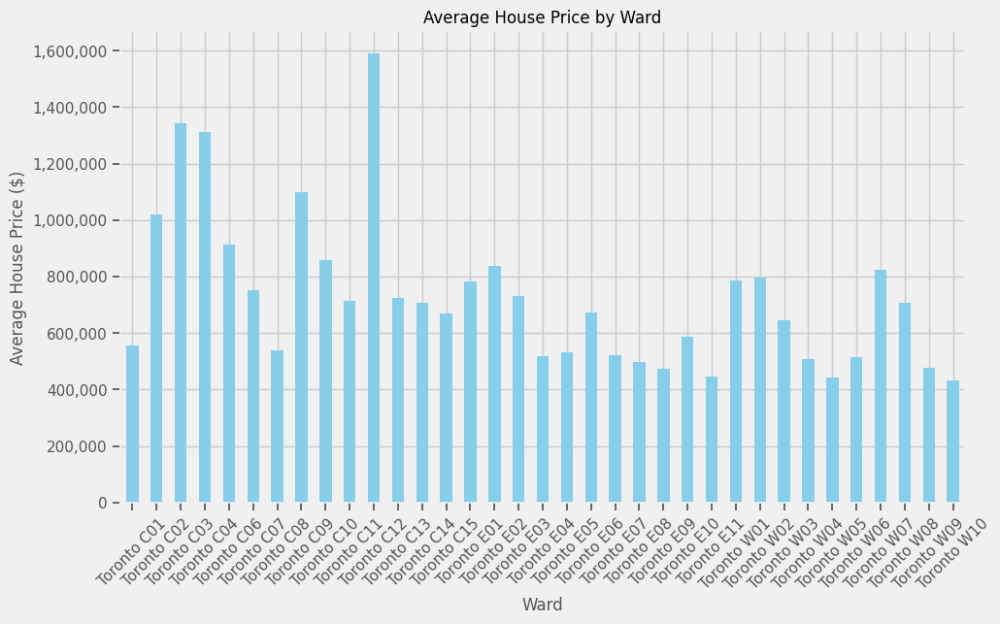

Ward
Toronto C01    555775.53
Toronto C02   1018489.36
Toronto C03   1343725.00
Toronto C04   1312000.68
Toronto C06    912614.19
Toronto C07    752359.46
Toronto C08    538328.72
Toronto C09   1100278.72
Toronto C10    856738.30
Toronto C11    715345.74
Toronto C12   1589901.06
Toronto C13    723538.30
Toronto C14    708247.87
Toronto C15    670024.47
Toronto E01    783134.04
Toronto E02    836923.40
Toronto E03    730016.67
Toronto E04    517958.51
Toronto E05    531679.79
Toronto E06    672543.33
Toronto E07    521468.09
Toronto E08    498478.72
Toronto E09    472950.00
Toronto E10    588426.60
Toronto E11    444700.00
Toronto W01    786173.40
Toronto W02    797742.55
Toronto W03    644735.00
Toronto W04    508863.83
Toronto W05    442086.17
Toronto W06    514211.70
Toronto W07    825102.13
Toronto W08    707030.85
Toronto W09    478024.47
Toronto W10    433637.23
Name: Composite Benchmark, dtype: float64


In [ ]:
from matplotlib.ticker import FuncFormatter
# Plotting 'ward' vs 'composite benchmark' to see how it varies
plt.figure(figsize=(20, 10))  # Set the size of the plot
average_house_prices = house_prices_simplified.groupby('Ward')['Composite Benchmark'].mean()

plt.figure(figsize=(10, 6))
ax = average_house_prices.plot(kind='bar', color='skyblue')

# Step 3: Add labels and title
plt.xlabel('Ward')
plt.ylabel('Average House Price ($)')
plt.title('Average House Price by Ward')
plt.xticks(rotation=45)
formatter = FuncFormatter(lambda x, _: f'{x:,.0f}')  # Format with commas and no decimals
ax.yaxis.set_major_formatter(formatter)

# Show the plot
plt.show()

# Optionally, print the average prices
print(average_house_prices)

<Figure size 1200x600 with 0 Axes>

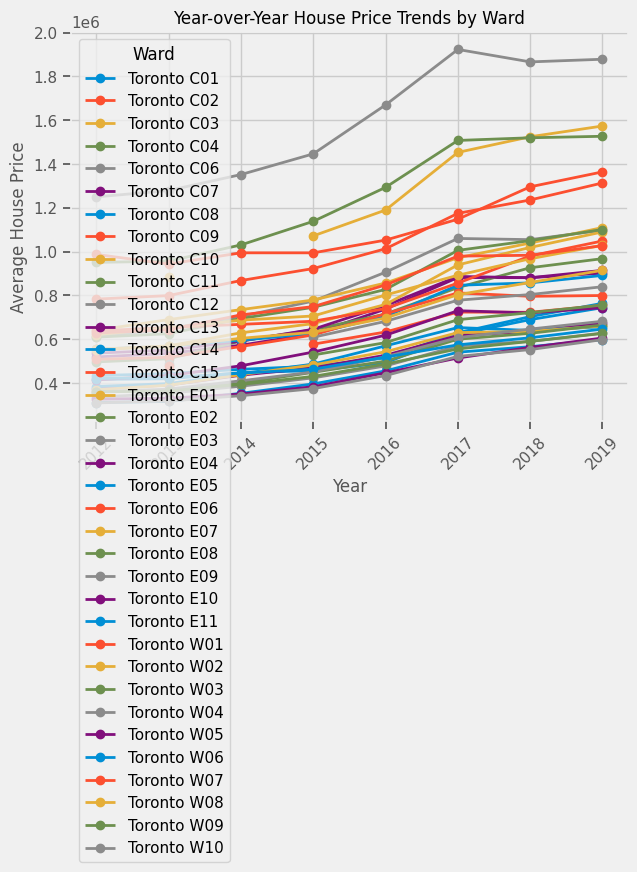

In [ ]:
annual_prices = house_prices_simplified.groupby(['Ward', 'Year'])['Composite Benchmark'].mean().unstack(level=0)

# Step 2: Plot the line chart
plt.figure(figsize=(12, 6))

# Plot the data for each ward
annual_prices.plot(kind='line', marker='o', linestyle='-', linewidth=2, markersize=6)

# Step 3: Add labels and title
plt.xlabel('Year')
plt.ylabel('Average House Price')
plt.title('Year-over-Year House Price Trends by Ward')
plt.xticks(rotation=45)  # Rotate x-axis labels if necessary
plt.legend(title='Ward', loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()

#### House price assessment using actual addresses

In [ ]:
#create a new map with neighbourhoods, house addresses, transit stations

# Create a map of Toronto
from folium import Icon
from folium import CircleMarker
map_toronto_addresses = folium.Map(location=[43.6426, -79.3871], 
                   tiles='cartodbpositron', 
                   zoom_start=11)

map_toronto_addresses

In [ ]:
#import neighbourhoods shp file and 
gdf_neighbourhoods = gpd.read_file('toronto_neighbourhoods.shp')
gdf_neighbourhoods

,FIELD_1,FIELD_2,FIELD_3,FIELD_4,FIELD_5,FIELD_6,FIELD_7,FIELD_8,FIELD_9,FIELD_10,FIELD_11,FIELD_12,FIELD_13,FIELD_14,FIELD_15,geometry
0,2101,25886861,25926662,49885,94,94,Wychwood (94),Wychwood (94),NaN,NaN,-79.43,43.68,16491505,3217959.61,7515.78,"POLYGON ((-79.43592 43.68015, -79.43492 43.680..."
1,2102,25886820,25926663,49885,100,100,Yonge-Eglinton (100),Yonge-Eglinton (100),NaN,NaN,-79.40,43.70,16491521,3160333.99,7872.02,"POLYGON ((-79.41096 43.70408, -79.40962 43.704..."
2,2103,25886834,25926664,49885,97,97,Yonge-St.Clair (97),Yonge-St.Clair (97),NaN,NaN,-79.40,43.69,16491537,2222464.27,8130.41,"POLYGON ((-79.39119 43.68108, -79.39141 43.680..."
3,2104,25886593,25926665,49885,27,27,York University Heights (27),York University Heights (27),NaN,NaN,-79.49,43.77,16491553,25418210.12,25632.34,"POLYGON ((-79.50529 43.75987, -79.50488 43.759..."
4,2105,25886688,25926666,49885,31,31,Yorkdale-Glen Park (31),Yorkdale-Glen Park (31),NaN,NaN,-79.46,43.71,16491569,11566687.56,13953.41,"POLYGON ((-79.43969 43.70561, -79.44011 43.705..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,2236,25886531,25926797,49885,124,124,Kennedy Park (124),Kennedy Park (124),NaN,NaN,-79.26,43.73,16493665,6861056.16,10530.20,"POLYGON ((-79.24549 43.7306, -79.24555 43.7305..."
136,2237,25886955,25926798,49885,78,78,Kensington-Chinatown (78),Kensington-Chinatown (78),NaN,NaN,-79.40,43.65,16493681,2933586.25,6945.06,"POLYGON ((-79.40401 43.64719, -79.40419 43.647..."
137,2238,25886737,25926799,49885,6,6,Kingsview Village-The Westway (6),Kingsview Village-The Westway (6),NaN,NaN,-79.55,43.70,16493697,9694496.36,14458.76,"POLYGON ((-79.55236 43.70947, -79.55229 43.709..."
138,2239,25886763,25926800,49885,15,15,Kingsway South (15),Kingsway South (15),NaN,NaN,-79.51,43.65,16493713,5043477.00,11140.67,"POLYGON ((-79.51703 43.64611, -79.51717 43.646..."


In [ ]:
# Write your code here.
gdf_neighbourhoods = gdf_neighbourhoods[['geometry', 'FIELD_8']].rename(columns={'FIELD_8': 'name'})
gdf_neighbourhoods['name'] = gdf_neighbourhoods['name'].str.split('(').str[0]

# View GeoDataFrame
gdf_neighbourhoods.head()

,geometry,name
0,"POLYGON ((-79.43592 43.68015, -79.43492 43.680...",Wychwood
1,"POLYGON ((-79.41096 43.70408, -79.40962 43.704...",Yonge-Eglinton
2,"POLYGON ((-79.39119 43.68108, -79.39141 43.680...",Yonge-St.Clair
3,"POLYGON ((-79.50529 43.75987, -79.50488 43.759...",York University Heights
4,"POLYGON ((-79.43969 43.70561, -79.44011 43.705...",Yorkdale-Glen Park


In [ ]:
gdf_neighbourhoods.crs


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
from shapely.geometry import Point

#read in file with houses, prices and coordinates for houses sold in 2024
house_addresses = pd.read_csv('zillow_coordinates.csv')

addresses_coords = [Point(lon, lat) for lon, lat in zip(house_addresses['Longitude'], house_addresses['Latitude'])]

gdf_house_addresses = gpd.GeoDataFrame(house_addresses, geometry=addresses_coords)


#filter to only include houses within the toronto neighbourhoods
gdf_house_addresses = gpd.sjoin(gdf_house_addresses, gdf_neighbourhoods, how="inner", predicate="intersects")

gdf_house_addresses

,address,price,link,bedrooms,bathrooms,cleaned_address,Latitude,Longitude,geometry,index_right,name
0,"2240 Lake Shore Blvd W #1701, Toronto, ON M8V 0B1","C$710,000",https://www.zillow.com/homedetails/2240-Lake-S...,--,--,"2240 Lake Shore Blvd W. , ON",43.62,-79.48,POINT (-79.48302 43.62124),16,Mimico
2,"899 Queen St E #409, Toronto, ON M4M 0C8","C$893,000",https://www.zillow.com/homedetails/899-Queen-S...,--,--,"899 Queen St E. , ON",43.66,-79.34,POINT (-79.34189 43.66052),49,South Riverdale
3,"49 E Liberty St #2508, Toronto, ON M6K 0A7","C$620,000",https://www.zillow.com/homedetails/49-E-Libert...,2,1,"49 E. Liberty St , ON",43.64,-79.41,POINT (-79.41255 43.63885),26,Niagara
4,"91 Drayton Ave, Toronto, ON M4C 3L8",$1.22M,https://www.zillow.com/homedetails/91-Drayton-...,--,--,"91 Drayton Ave, ON",43.68,-79.32,POINT (-79.31893 43.68165),72,Woodbine Corridor
5,"1 Yorkville Ave #4803, Toronto, ON M4W",$1.55M,https://www.zillow.com/homedetails/1-Yorkville...,2,2,"1 Yorkville Ave , ON",43.67,-79.39,POINT (-79.38768 43.67161),77,Annex
...,...,...,...,...,...,...,...,...,...,...,...
313,"33 Mill St #2406, Toronto, ON M5A 3R3","C$955,000",https://www.zillow.com/homedetails/33-Mill-St-...,--,--,"33 Mill St , ON",43.65,-79.36,POINT (-79.36084 43.65034),61,Waterfront Communities-The Island
314,"64 Granby St, Toronto, ON M5B 2J5",$1.82M,https://www.zillow.com/homedetails/64-Granby-S...,--,--,"64 Granby St, ON",43.66,-79.38,POINT (-79.37988 43.66118),97,Church-Yonge Corridor
315,"35 Green Belt Dr, Toronto, ON M3C 1L8",$1.48M,https://www.zillow.com/homedetails/35-Green-Be...,--,--,"35 Green Belt Dr, ON",43.73,-79.34,POINT (-79.33626 43.73025),78,Banbury-Don Mills
316,"110B Palmerston Ave, Toronto, ON M6J 2H7",$1.78M,https://www.zillow.com/homedetails/110B-Palmer...,--,--,"110B Palmerston Ave, ON",43.67,-79.42,POINT (-79.41685 43.67291),77,Annex


In [ ]:
# add neighbourhoods, addresses for homes, and transit stations to this map
folium.GeoJson(
    gdf_neighbourhoods,
    name="Toronto Neighbourhoods",
    popup=folium.GeoJsonPopup(fields=["name"], aliases=["Neighbourhood:"]),
    style_function=lambda feature: {
        'fillColor': '#134d6e',
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.5
    }
).add_to(map_toronto_addresses)

for index, row in gdf_house_addresses.iterrows():
    popup_content=f"Address: {row['cleaned_address']}<br>Sold_Price: {row['price']}<br>Neighbourhood: {row['name']}"

    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=folium.Popup(popup_content, max_width=200),
).add_to(map_toronto_addresses)


map_toronto_addresses


In [ ]:
#clean up house prices in the gdf_house_addresses dataframe, and extract only the columns we need
gdf_house_addresses.drop(columns=['link','bedrooms','bathrooms'], inplace=True)
gdf_house_addresses

,address,price,cleaned_address,Latitude,Longitude,geometry,index_right,name
0,"2240 Lake Shore Blvd W #1701, Toronto, ON M8V 0B1","C$710,000","2240 Lake Shore Blvd W. , ON",43.62,-79.48,POINT (-79.48302 43.62124),16,Mimico
2,"899 Queen St E #409, Toronto, ON M4M 0C8","C$893,000","899 Queen St E. , ON",43.66,-79.34,POINT (-79.34189 43.66052),49,South Riverdale
3,"49 E Liberty St #2508, Toronto, ON M6K 0A7","C$620,000","49 E. Liberty St , ON",43.64,-79.41,POINT (-79.41255 43.63885),26,Niagara
4,"91 Drayton Ave, Toronto, ON M4C 3L8",$1.22M,"91 Drayton Ave, ON",43.68,-79.32,POINT (-79.31893 43.68165),72,Woodbine Corridor
5,"1 Yorkville Ave #4803, Toronto, ON M4W",$1.55M,"1 Yorkville Ave , ON",43.67,-79.39,POINT (-79.38768 43.67161),77,Annex
...,...,...,...,...,...,...,...,...
313,"33 Mill St #2406, Toronto, ON M5A 3R3","C$955,000","33 Mill St , ON",43.65,-79.36,POINT (-79.36084 43.65034),61,Waterfront Communities-The Island
314,"64 Granby St, Toronto, ON M5B 2J5",$1.82M,"64 Granby St, ON",43.66,-79.38,POINT (-79.37988 43.66118),97,Church-Yonge Corridor
315,"35 Green Belt Dr, Toronto, ON M3C 1L8",$1.48M,"35 Green Belt Dr, ON",43.73,-79.34,POINT (-79.33626 43.73025),78,Banbury-Don Mills
316,"110B Palmerston Ave, Toronto, ON M6J 2H7",$1.78M,"110B Palmerston Ave, ON",43.67,-79.42,POINT (-79.41685 43.67291),77,Annex


In [ ]:
def clean_price(price_str):
    # Remove unwanted characters like '$', 'C', and ','
    price_str = price_str.replace('C$', '').replace('$', '').replace(',', '').strip()

    # Check if the price ends with 'M' (Million)
    if 'M' in price_str:
        return float(price_str.replace('M', '').strip()) * 1_000_000
    # Convert to numeric (for any remaining values like numbers without 'M' or 'K')
    else:
        try:
            return float(price_str)
        except ValueError:
            return None 
        
gdf_house_addresses['price'] = gdf_house_addresses['price'].apply(clean_price)


In [ ]:
gdf_house_addresses

,address,price,cleaned_address,Latitude,Longitude,geometry,index_right,name
0,"2240 Lake Shore Blvd W #1701, Toronto, ON M8V 0B1",710000.00,"2240 Lake Shore Blvd W. , ON",43.62,-79.48,POINT (-79.48302 43.62124),16,Mimico
2,"899 Queen St E #409, Toronto, ON M4M 0C8",893000.00,"899 Queen St E. , ON",43.66,-79.34,POINT (-79.34189 43.66052),49,South Riverdale
3,"49 E Liberty St #2508, Toronto, ON M6K 0A7",620000.00,"49 E. Liberty St , ON",43.64,-79.41,POINT (-79.41255 43.63885),26,Niagara
4,"91 Drayton Ave, Toronto, ON M4C 3L8",1220000.00,"91 Drayton Ave, ON",43.68,-79.32,POINT (-79.31893 43.68165),72,Woodbine Corridor
5,"1 Yorkville Ave #4803, Toronto, ON M4W",1550000.00,"1 Yorkville Ave , ON",43.67,-79.39,POINT (-79.38768 43.67161),77,Annex
...,...,...,...,...,...,...,...,...
313,"33 Mill St #2406, Toronto, ON M5A 3R3",955000.00,"33 Mill St , ON",43.65,-79.36,POINT (-79.36084 43.65034),61,Waterfront Communities-The Island
314,"64 Granby St, Toronto, ON M5B 2J5",1820000.00,"64 Granby St, ON",43.66,-79.38,POINT (-79.37988 43.66118),97,Church-Yonge Corridor
315,"35 Green Belt Dr, Toronto, ON M3C 1L8",1480000.00,"35 Green Belt Dr, ON",43.73,-79.34,POINT (-79.33626 43.73025),78,Banbury-Don Mills
316,"110B Palmerston Ave, Toronto, ON M6J 2H7",1780000.00,"110B Palmerston Ave, ON",43.67,-79.42,POINT (-79.41685 43.67291),77,Annex


In [ ]:
gdf_house_addresses['price'].unique()

array([ 710000.,  893000.,  620000., 1220000., 1550000.,  990000.,
       1350000., 1020000., 1390000., 1250000., 2790000.,  900000.,
       1070000.,  815000., 4000000., 1630000., 2410000., 1530000.,
       1210000., 1280000., 1260000., 1200000., 1680000., 1150000.,
       1400000., 1430000.,  560000., 1190000., 1420000.,  875000.,
            nan,  500000.,  478500.,  490000., 1380000., 1170000.,
       1850000., 3640000., 2260000., 1640000., 2400000., 1650000.,
       1010000., 3700000.,  910000., 4050000., 1700000., 2000000.,
       1410000.,  943000.,  626000., 1040000., 1720000., 1370000.,
       1620000., 1610000., 1830000., 1450000., 1080000., 1130000.,
       1480000., 1100000., 1500000., 1930000.,  695000., 1030000.,
       2950000.,  999000., 1310000.,  831100., 3400000., 3760000.,
        999900.,  999999., 4500000.,  800000., 3450000., 1490000.,
       1890000., 1230000., 3800000., 3200000.,  715000.,  850000.,
       1060000.,  540000.,  855000., 1140000., 1440000.,  7600

In [ ]:
#drop the row with the nan value
gdf_house_addresses = gdf_house_addresses.dropna(subset=['price'])

gdf_house_addresses

,address,price,cleaned_address,Latitude,Longitude,geometry,index_right,name
0,"2240 Lake Shore Blvd W #1701, Toronto, ON M8V 0B1",710000.00,"2240 Lake Shore Blvd W. , ON",43.62,-79.48,POINT (-79.48302 43.62124),16,Mimico
2,"899 Queen St E #409, Toronto, ON M4M 0C8",893000.00,"899 Queen St E. , ON",43.66,-79.34,POINT (-79.34189 43.66052),49,South Riverdale
3,"49 E Liberty St #2508, Toronto, ON M6K 0A7",620000.00,"49 E. Liberty St , ON",43.64,-79.41,POINT (-79.41255 43.63885),26,Niagara
4,"91 Drayton Ave, Toronto, ON M4C 3L8",1220000.00,"91 Drayton Ave, ON",43.68,-79.32,POINT (-79.31893 43.68165),72,Woodbine Corridor
5,"1 Yorkville Ave #4803, Toronto, ON M4W",1550000.00,"1 Yorkville Ave , ON",43.67,-79.39,POINT (-79.38768 43.67161),77,Annex
...,...,...,...,...,...,...,...,...
313,"33 Mill St #2406, Toronto, ON M5A 3R3",955000.00,"33 Mill St , ON",43.65,-79.36,POINT (-79.36084 43.65034),61,Waterfront Communities-The Island
314,"64 Granby St, Toronto, ON M5B 2J5",1820000.00,"64 Granby St, ON",43.66,-79.38,POINT (-79.37988 43.66118),97,Church-Yonge Corridor
315,"35 Green Belt Dr, Toronto, ON M3C 1L8",1480000.00,"35 Green Belt Dr, ON",43.73,-79.34,POINT (-79.33626 43.73025),78,Banbury-Don Mills
316,"110B Palmerston Ave, Toronto, ON M6J 2H7",1780000.00,"110B Palmerston Ave, ON",43.67,-79.42,POINT (-79.41685 43.67291),77,Annex


#### Now that we have the prices cleaned up for the 2024 Zillow data, we will find the average price per neighbourhood and plot a choropleth map overlaid with the transit stations to see whether the prices are higher in neighbourhoods with transit stations

In [ ]:

avg_price_neighbourhood=gdf_house_addresses.groupby('name')['price'].mean().reset_index()
avg_price_neighbourhood

,name,price
0,Agincourt North,990000.00
1,Agincourt South-Malvern West,1298000.00
2,Alderwood,1560000.00
3,Annex,2108571.43
4,Banbury-Don Mills,1990000.00
...,...,...
99,Woodbine Corridor,1277500.00
100,Woodbine-Lumsden,1370000.00
101,Wychwood,1620000.00
102,Yonge-Eglinton,2050000.00


In [ ]:
#merge the neighbourhood data with this average price
gdf_neighbourhoods = gdf_neighbourhoods.merge(avg_price_neighbourhood, on='name', how='left')
gdf_neighbourhoods

,geometry,name,price
0,"POLYGON ((-79.43592 43.68015, -79.43492 43.680...",Wychwood,1620000.00
1,"POLYGON ((-79.41096 43.70408, -79.40962 43.704...",Yonge-Eglinton,2050000.00
2,"POLYGON ((-79.39119 43.68108, -79.39141 43.680...",Yonge-St.Clair,1236250.00
3,"POLYGON ((-79.50529 43.75987, -79.50488 43.759...",York University Heights,NaN
4,"POLYGON ((-79.43969 43.70561, -79.44011 43.705...",Yorkdale-Glen Park,NaN
...,...,...,...
135,"POLYGON ((-79.24549 43.7306, -79.24555 43.7305...",Kennedy Park,NaN
136,"POLYGON ((-79.40401 43.64719, -79.40419 43.647...",Kensington-Chinatown,NaN
137,"POLYGON ((-79.55236 43.70947, -79.55229 43.709...",Kingsview Village-The Westway,NaN
138,"POLYGON ((-79.51703 43.64611, -79.51717 43.646...",Kingsway South,1435000.00


In [ ]:
#view which neighbourhoods do not have any houses in the dataset. This will affect our visual
gdf_neighbourhoods[gdf_neighbourhoods['price'].isna()]


,geometry,name,price
3,"POLYGON ((-79.50529 43.75987, -79.50488 43.759...",York University Heights,NaN
4,"POLYGON ((-79.43969 43.70561, -79.44011 43.705...",Yorkdale-Glen Park,NaN
5,"POLYGON ((-79.50552 43.66281, -79.50577 43.662...",Lambton Baby Point,NaN
11,"POLYGON ((-79.51905 43.59058, -79.51904 43.590...",Long Branch,NaN
14,"POLYGON ((-79.55959 43.63624, -79.55957 43.636...",Markland Wood,NaN
20,"POLYGON ((-79.60338 43.75786, -79.60205 43.758...",Mount Olive-Silverstone-Jamestown,NaN
23,"POLYGON ((-79.51905 43.59058, -79.51914 43.590...",New Toronto,NaN
29,"POLYGON ((-79.33542 43.7032, -79.33529 43.7032...",O'Connor-Parkview,NaN
32,"POLYGON ((-79.35056 43.69941, -79.35041 43.699...",Old East York,NaN
40,"POLYGON ((-79.55512 43.7151, -79.55504 43.7148...",Rexdale-Kipling,NaN


In [ ]:
# plot choropleth map of the neighbourhoods by price - create a new map to do this analysis

map_toronto_neighbourhoods_price = folium.Map(location=[43.7, -79.42], zoom_start=11)

folium.Choropleth(
    geo_data=gdf_neighbourhoods,
    name="Average House Price by Neighbourhood",
    data=gdf_neighbourhoods,
    columns=["name", "price"],  # Columns to map (neighbourhood name and average price)
    key_on="feature.properties.name",  # Link the GeoJSON feature's 'name' property to the data
    fill_color="YlOrRd",  # Color scheme
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Average House Price (in $)",
).add_to(map_toronto_neighbourhoods_price)


# Add layer control to toggle the choropleth layer
folium.LayerControl().add_to(map_toronto_neighbourhoods_price)

# Display the map
map_toronto_neighbourhoods_price

In [ ]:
#add all the subway stations
for _, row in gdf_points_toronto.iterrows():
    # Extract latitude and longitude from the geometry (point)
    lat, lon = row.geometry.y, row.geometry.x
    
    # Set color based on the 'STATUS' column
    if row['TECHNOLOGY'] == 'Obsolete':
        color = 'grey'  # Blue for proposed stations
    elif row['STATUS'] == 'Existing':
        color = 'green'  # Green for existing stations
    elif row['STATUS'] == 'Proposed':
        color = 'blue'  # Blue for proposed stations
    elif row['STATUS'] == 'In Delivery':
        color = 'orange'  # Orange for stations in delivery
    elif row['STATUS'] == 'Advancing':
        color = 'purple'  # purple for stations advancing

    else:
        color = 'red'  # Default red for other statuses

    # Create a small circle using CircleMarker
    folium.CircleMarker(
        location=(lat, lon),  # Coordinates of the point
        radius=5,  # Size of the circle
        color=color,  # Border color (based on status)
        fill=True,  # Fill the circle with color
        fill_color=color,  # Circle fill color (same as border color)
        fill_opacity=0.7,  # Opacity of the fill (make it slightly transparent)
        popup=f"Location: {row['LOCATION_N']}<br>Technology: {row['TECHNOLOGY']}<br>Status: {row['STATUS']}<br>Line: {row['NAME']}"  # Popup info
    ).add_to(map_toronto_neighbourhoods_price)

# Display the map
map_toronto_neighbourhoods_price

##### Elginton Crosstown LRT assessment

In [ ]:
# #new map to view the Eglinton LRT stations only
# map_neighbourhoods_eglinton = folium.Map(location=[43.7, -79.42], zoom_start=11)

# for _, row in gdf_points_toronto.iterrows():
#     # Check if the station's name is 'Eglinton Crosstown LRT'
#     if row['NAME'] == 'Eglinton Crosstown LRT':
#         # Extract latitude and longitude from the geometry (point)
#         lat, lon = row.geometry.y, row.geometry.x

#         # Set color for Eglinton Crosstown LRT stations
#         color = 'green'  # Green for Eglinton Crosstown LRT stations
        
#     # Create a small circle using CircleMarker
#     folium.CircleMarker(
#         location=(lat, lon),  # Coordinates of the point
#         radius=5,  # Size of the circle
#         color=color,  # Border color (based on status)
#         fill=True,  # Fill the circle with color
#         fill_color=color,  # Circle fill color (same as border color)
#         fill_opacity=0.7,  # Opacity of the fill (make it slightly transparent)
#         popup=f"Location: {row['LOCATION_N']}<br>Technology: {row['TECHNOLOGY']}<br>Status: {row['STATUS']}<br>Line: {row['NAME']}"  # Popup info
#     ).add_to(map_neighbourhoods_eglinton)

# # Display the map
# map_neighbourhoods_eglinton

In [ ]:
#import MLS municipalities map which is what the other house prices dataframe references

json_file_path = "muni.json"

# Read the JSON data
with open(json_file_path, 'r') as f:
    data = json.load(f)

# Create lists to store the features and properties
features = []
canonicalName = []

# Loop through each item in the JSON data and extract the geometry and properties
for item in data:
    # Convert the geometry into a shapely object (MultiPolygon or Polygon)
    geometry = shape(item['geometry'])  # Convert the geometry to Shapely geometry
    features.append(geometry)
    
    # Extract the canonicalName property and add it to the list
    canonicalName.append(item['canonicalName'])  # Adjust based on your JSON structure

# Create a GeoDataFrame from the features and properties
gdf_municipalities = gpd.GeoDataFrame(
    {'Municipality': canonicalName},  # Add the municipality names
    geometry=features  # Specify the geometry column
)

gdf_municipalities.set_crs("EPSG:4326", allow_override=True, inplace=True)

# Change CRS to EPSG:4326 (WGS 84)
gdf_municipalities = gdf_municipalities.to_crs(epsg=4326)

# Save this GeoDataFrame as a GeoJSON file
gdf_municipalities.to_file("municipalities.geojson", driver="GeoJSON")

# Display the GeoDataFrame
print(gdf_municipalities.head())



  Municipality                                           geometry
0  Toronto E09  MULTIPOLYGON (((-79.19067 43.7789, -79.1917 43...
1  Toronto E05  MULTIPOLYGON (((-79.29702 43.80165, -79.29661 ...
2  Toronto W03  MULTIPOLYGON (((-79.44436 43.68118, -79.44395 ...
3  Toronto C15  MULTIPOLYGON (((-79.38287 43.76385, -79.3868 4...
4  Toronto C03  MULTIPOLYGON (((-79.39663 43.69829, -79.39646 ...


In [ ]:
#create a map of the municipalities
map_municipalities = folium.Map(location=[43.7, -79.42], zoom_start=11)

# Add GeoJSON data to the folium map
folium.GeoJson(
    gdf_municipalities,
    name="Toronto Municipalities",
    popup=folium.GeoJsonPopup(fields=["Municipality"]),
    style_function=lambda feature: {
        'fillColor': '#134d6e',
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.5
    }
).add_to(map_municipalities)

# Display the map
map_municipalities


In [ ]:
#add eglinton stations to the map

for _, row in gdf_points_toronto.iterrows():
   # Extract latitude and longitude from the geometry (point)
    lat, lon = row.geometry.y, row.geometry.x
    # Set color based on the 'STATUS' column
    if row['NAME'] == 'Eglinton Crosstown LRT':
        color = 'green'  
    elif row['NAME'] == 'Scarborough Subway Extension':
        color = 'pink' 
    elif row['STATUS'] == 'Existing':
        color = 'orange' 
    else:
        color = 'grey' 

    # Create a small circle using CircleMarker
    folium.CircleMarker(
        location=(lat, lon),  # Coordinates of the point
        radius=5,  # Size of the circle
        color=color,  # Border color (based on status)
        fill=True,  # Fill the circle with color
        fill_color=color,  # Circle fill color (same as border color)
        fill_opacity=0.7,  # Opacity of the fill (make it slightly transparent)
        popup=f"Location: {row['LOCATION_N']}<br>Technology: {row['TECHNOLOGY']}<br>Status: {row['STATUS']}<br>Line: {row['NAME']}"  # Popup info
    ).add_to(map_municipalities)

# Display the map
map_municipalities

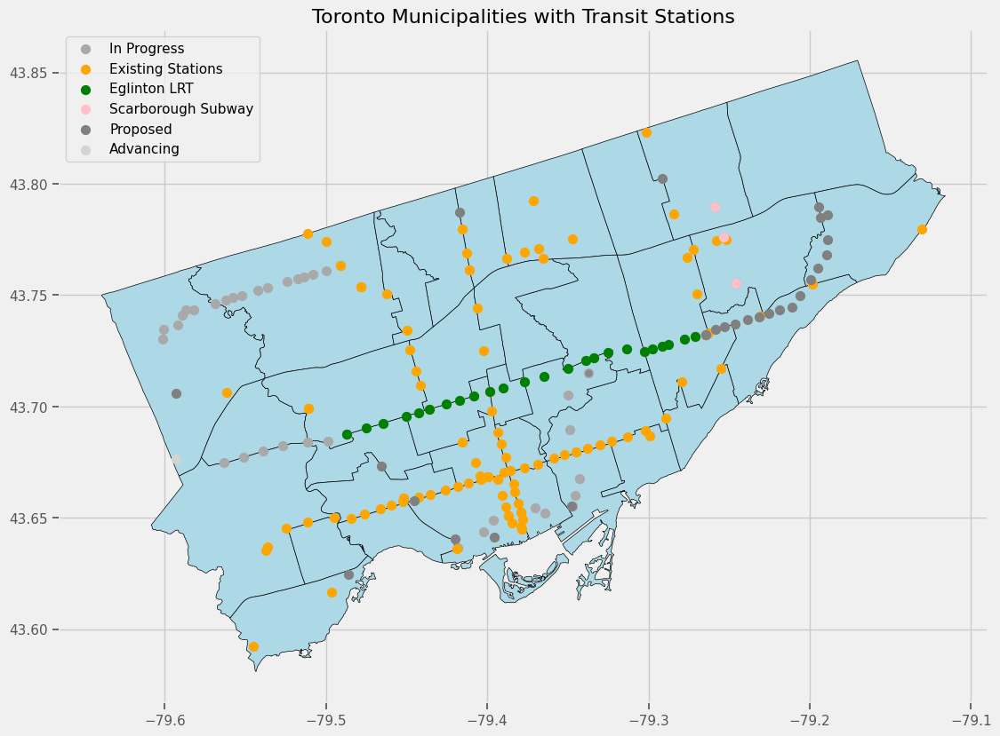

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))

# Plot the municipalities geometries (polygons) on the map
gdf_municipalities.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.5)


gdf_points_toronto[gdf_points_toronto['STATUS'] == 'In Delivery'].plot(ax=ax, color='darkgrey', markersize=50, label='In Progress')
gdf_points_toronto[gdf_points_toronto['STATUS'] == 'Existing'].plot(ax=ax, color='orange', markersize=50, label='Existing Stations')
gdf_points_toronto[gdf_points_toronto['NAME'] == 'Eglinton Crosstown LRT'].plot(ax=ax, color='green', markersize=50, label='Eglinton LRT')
gdf_points_toronto[gdf_points_toronto['NAME'] == 'Scarborough Subway Extension'].plot(ax=ax, color='pink', markersize=50, label='Scarborough Subway')
gdf_points_toronto[gdf_points_toronto['STATUS'] == 'Proposed'].plot(ax=ax, color='grey', markersize=50, label='Proposed')
gdf_points_toronto[gdf_points_toronto['STATUS'] == 'Advancing'].plot(ax=ax, color='lightgrey', markersize=50, label='Advancing')



# Plot the point (station) with the corresponding color
ax.plot(lon, lat, marker='o', color=color, markersize=5, label=row['NAME'] if color == 'green' else "", alpha=0.7)

# Optionally, add a legend to differentiate stations based on their names or colors
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, loc='upper left')

# Add title and labels
ax.set_title("Toronto Municipalities with Transit Stations", fontsize=16)

# Save the figure as a PNG image (static plot)
plt.savefig('plots/toronto_muni_with_stations.png', dpi=300)

# Display the static plot
plt.show()

In [ ]:
#find the average price per municipality
house_prices_simplified.rename(columns={'Ward':'Municipality'}, inplace=True)

avg_price_municipality=house_prices_simplified.groupby('Municipality')['Composite Benchmark'].mean().reset_index()
avg_price_municipality.head()


,Municipality,Composite Benchmark
0,Toronto C01,555775.53
1,Toronto C02,1018489.36
2,Toronto C03,1343725.00
3,Toronto C04,1312000.68
4,Toronto C06,912614.19


In [ ]:
#merge the municipality data with this average price
gdf_municipalities_avg = gdf_municipalities.merge(avg_price_municipality, on='Municipality', how='left')
gdf_municipalities_avg.head()

,Municipality,geometry,Composite Benchmark
0,Toronto E09,"MULTIPOLYGON (((-79.19067 43.7789, -79.1917 43...",472950.00
1,Toronto E05,"MULTIPOLYGON (((-79.29702 43.80165, -79.29661 ...",531679.79
2,Toronto W03,"MULTIPOLYGON (((-79.44436 43.68118, -79.44395 ...",644735.00
3,Toronto C15,"MULTIPOLYGON (((-79.38287 43.76385, -79.3868 4...",670024.47
4,Toronto C03,"MULTIPOLYGON (((-79.39663 43.69829, -79.39646 ...",1343725.00


In [ ]:
# plot choropleth map of the neighbourhoods by price - create a new map to do this analysis

map_toronto_municipalities_price = folium.Map(location=[43.7, -79.42], zoom_start=11)


folium.Choropleth(
    geo_data=gdf_municipalities_avg,
    name="Average House Price by Municipality",
    data=gdf_municipalities_avg,
    columns=["Municipality", "Composite Benchmark"],  # Columns to map 
    key_on="feature.properties.Municipality",  # Link the GeoJSON feature's 'name' property to the data
    fill_color="YlOrRd",  # Color scheme
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Average House Price (in $)",
).add_to(map_toronto_municipalities_price)


# Add layer control to toggle the choropleth layer
folium.LayerControl().add_to(map_toronto_municipalities_price)

# Display the map
map_toronto_municipalities_price

In [ ]:

for _, row in gdf_points_toronto.iterrows():
   # Extract latitude and longitude from the geometry (point)
    lat, lon = row.geometry.y, row.geometry.x
    # Set color based on the 'STATUS' column
    if row['NAME'] == 'Eglinton Crosstown LRT':
        color = 'green'  
    elif row['NAME'] == 'Scarborough Subway Extension':
        color = 'pink' 
    elif row['STATUS'] == 'Existing':
        color = 'orange' 
    else:
        color = 'grey' 

    # Create a small circle using CircleMarker
    folium.CircleMarker(
        location=(lat, lon),  # Coordinates of the point
        radius=5,  # Size of the circle
        color=color,  # Border color (based on status)
        fill=True,  # Fill the circle with color
        fill_color=color,  # Circle fill color (same as border color)
        fill_opacity=0.7,  # Opacity of the fill (make it slightly transparent)
        popup=f"Location: {row['LOCATION_N']}<br>Technology: {row['TECHNOLOGY']}<br>Status: {row['STATUS']}<br>Line: {row['NAME']}"  # Popup info
    ).add_to(map_toronto_municipalities_price)

# Display the map
map_toronto_municipalities_price

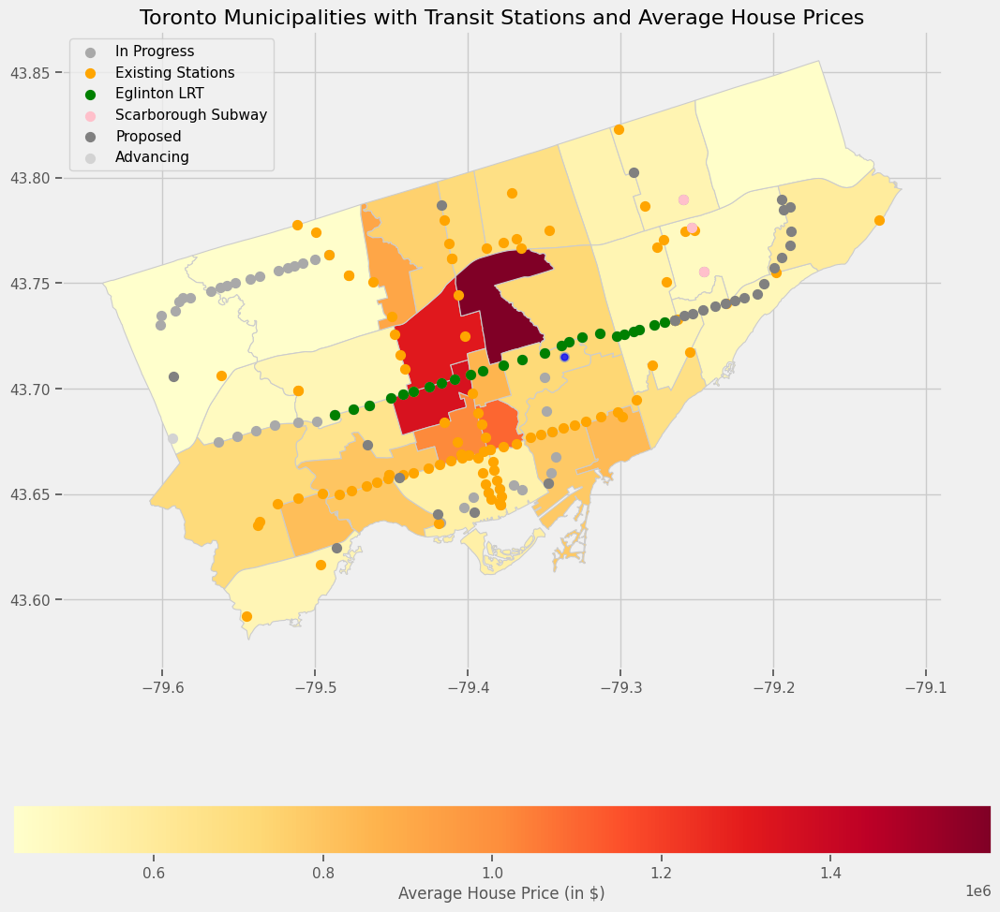

In [3805]:

from matplotlib import cm

# Assuming gdf_municipalities_avg contains your municipality data and Composite Benchmark is the price column
# Assuming gdf_points_toronto contains your transit stations with lat, lon, and STATUS/NAME

# Create a figure and axis to plot
fig, ax = plt.subplots(figsize=(12, 12))

# Plot the municipalities geometries with color based on 'Composite Benchmark' (average house price)
# Normalize the 'Composite Benchmark' column to scale the color
norm = plt.Normalize(vmin=gdf_municipalities_avg['Composite Benchmark'].min(), 
                     vmax=gdf_municipalities_avg['Composite Benchmark'].max())

# Create a colormap (e.g., "YlOrRd")
cmap = cm.YlOrRd

# Plot the GeoDataFrame (municipalities) with color based on average price
gdf_municipalities_avg.plot(ax=ax, column='Composite Benchmark', cmap=cmap, linewidth=0.8, edgecolor='0.8', legend=True,
                            legend_kwds={'label': "Average House Price (in $)", 'orientation': "horizontal"}, norm=norm)

# Plot the transit stations (circle markers) based on their name and status

gdf_points_toronto[gdf_points_toronto['STATUS'] == 'In Delivery'].plot(ax=ax, color='darkgrey', markersize=50, label='In Progress')
gdf_points_toronto[gdf_points_toronto['STATUS'] == 'Existing'].plot(ax=ax, color='orange', markersize=50, label='Existing Stations')
gdf_points_toronto[gdf_points_toronto['NAME'] == 'Eglinton Crosstown LRT'].plot(ax=ax, color='green', markersize=50, label='Eglinton LRT')
gdf_points_toronto[gdf_points_toronto['NAME'] == 'Scarborough Subway Extension'].plot(ax=ax, color='pink', markersize=50, label='Scarborough Subway')
gdf_points_toronto[gdf_points_toronto['STATUS'] == 'Proposed'].plot(ax=ax, color='grey', markersize=50, label='Proposed')
gdf_points_toronto[gdf_points_toronto['STATUS'] == 'Advancing'].plot(ax=ax, color='lightgrey', markersize=50, label='Advancing')

# Plot the point (station) with the corresponding color
ax.plot(lon, lat, marker='o', color=color, markersize=5, label=row['NAME'] if color == 'green' else "", alpha=0.7)

# Optionally, add a legend to differentiate stations based on their names or colors
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, loc='upper left')

# Add title and labels
ax.set_title("Toronto Municipalities with Transit Stations and Average House Prices", fontsize=16)

# Save the figure as a PNG image (static plot)
plt.savefig('plots/toronto_map_with_stations_and_prices.png', dpi=300)

# Display the static plot
plt.show()


In [ ]:
house_prices_simplified

,Municipality,Composite Yr./Yr. Change%,Composite Benchmark,Year,Month
0,Toronto C04,1.21%,1542800,2019,February
1,Toronto C06,-0.63%,1048700,2019,February
2,Toronto C07,1.19%,883600,2019,February
3,Toronto C08,10.39%,719600,2019,February
4,Toronto C09,3.93%,1274100,2019,February
...,...,...,...,...,...
3504,Toronto E07,5.95%,390700,2013,May
3505,Toronto E08,1.15%,365400,2013,May
3506,Toronto E09,4.19%,354500,2013,May
3507,Toronto E10,3.68%,430600,2013,May


In [ ]:
#clean up year over year change by removing %
house_prices_simplified['Composite Yr./Yr. Change%'] = house_prices_simplified['Composite Yr./Yr. Change%'].str.replace('%', '').astype(float)
pd.set_option('display.float_format', '{:.2f}'.format)

house_prices_simplified

,Municipality,Composite Yr./Yr. Change%,Composite Benchmark,Year,Month
0,Toronto C04,1.21,1542800,2019,February
1,Toronto C06,-0.63,1048700,2019,February
2,Toronto C07,1.19,883600,2019,February
3,Toronto C08,10.39,719600,2019,February
4,Toronto C09,3.93,1274100,2019,February
...,...,...,...,...,...
3504,Toronto E07,5.95,390700,2013,May
3505,Toronto E08,1.15,365400,2013,May
3506,Toronto E09,4.19,354500,2013,May
3507,Toronto E10,3.68,430600,2013,May


In [ ]:
#look at the house_prices_simplified dataset and get the average price per municipality by year

house_prices_annual_municipality = house_prices_simplified.groupby(['Municipality', 'Year'])['Composite Benchmark'].mean().reset_index()
house_prices_annual_municipality['YoY Change'] = house_prices_simplified.groupby(['Municipality', 'Year'])['Composite Yr./Yr. Change%'].mean().reset_index()['Composite Yr./Yr. Change%']

house_prices_annual_municipality

#

,Municipality,Year,Composite Benchmark,YoY Change
0,Toronto C01,2012,433618.18,6.49
1,Toronto C01,2013,443036.36,1.02
2,Toronto C01,2014,462566.67,4.18
3,Toronto C01,2015,476525.00,3.42
4,Toronto C01,2016,514616.67,7.97
...,...,...,...,...
267,Toronto W10,2015,374275.00,9.44
268,Toronto W10,2016,433858.33,15.85
269,Toronto W10,2017,521433.33,22.47
270,Toronto W10,2018,552558.33,6.19


In [ ]:
gdf_municipalities = gdf_municipalities.merge(house_prices_annual_municipality, 
                                               on='Municipality', 
                                               how='left')
gdf_municipalities

,Municipality,geometry,Year,Composite Benchmark,YoY Change
0,Toronto E09,"MULTIPOLYGON (((-79.19067 43.7789, -79.1917 43...",2012,335190.91,4.64
1,Toronto E09,"MULTIPOLYGON (((-79.19067 43.7789, -79.1917 43...",2013,352909.09,5.64
2,Toronto E09,"MULTIPOLYGON (((-79.19067 43.7789, -79.1917 43...",2014,385425.00,8.83
3,Toronto E09,"MULTIPOLYGON (((-79.19067 43.7789, -79.1917 43...",2015,423375.00,9.84
4,Toronto E09,"MULTIPOLYGON (((-79.19067 43.7789, -79.1917 43...",2016,477916.67,12.82
...,...,...,...,...,...
267,Toronto E06,"MULTIPOLYGON (((-79.24625 43.69951, -79.24681 ...",2015,577350.00,11.25
268,Toronto E06,"MULTIPOLYGON (((-79.24625 43.69951, -79.24681 ...",2016,632908.33,14.16
269,Toronto E06,"MULTIPOLYGON (((-79.24625 43.69951, -79.24681 ...",2017,723783.33,16.24
270,Toronto E06,"MULTIPOLYGON (((-79.24625 43.69951, -79.24681 ...",2018,723000.00,-0.07


In [ ]:
#create a plot to show the Year over year change in prices for the entire Toronto area; the municipalities which contain the Eglinton LRT, and the municipalities which contain the existing transit stations

eglinton_LRT_municipalities = gpd.sjoin(gdf_municipalities, eglinton_LRT_stations, how='inner', predicate='intersects')
mean_eglinton_municipalities = eglinton_LRT_municipalities.groupby(['Municipality', 'Year'])['YoY Change'].mean().reset_index()
mean_eglinton_municipalities['Composite Benchmark'] = eglinton_LRT_municipalities.groupby(['Municipality', 'Year'])['Composite Benchmark'].mean().reset_index()['Composite Benchmark']

#create a dataframe with the existing stations that are still active (including obsolete stations since they were active over the years) and do a spatial join with the municipality it intersects
existing_stations_municipalities = gdf_points[gdf_points['STATUS'] == 'Existing']
existing_stations_municipalities = gpd.sjoin(gdf_municipalities, existing_stations_municipalities, how='inner', predicate='intersects')
mean_existing_municipalities = existing_stations_municipalities.groupby(['Municipality', 'Year'])['YoY Change'].mean().reset_index()
mean_existing_municipalities['Composite Benchmark'] = existing_stations_municipalities.groupby(['Municipality', 'Year'])['Composite Benchmark'].mean().reset_index()['Composite Benchmark']

#create a dataframe with the Scarborough Subway Extension stations
scarborough_extension_municipalities = gdf_points[gdf_points['NAME'] == 'Scarborough Subway Extension']



In [ ]:
mean_eglinton_municipalities['Municipality'].unique()

array(['Toronto C03', 'Toronto C04', 'Toronto C10', 'Toronto C11',
       'Toronto C13', 'Toronto E04', 'Toronto W04'], dtype=object)

In [ ]:
mean_existing_municipalities['Municipality'].unique()

array(['Toronto C01', 'Toronto C02', 'Toronto C03', 'Toronto C04',
       'Toronto C06', 'Toronto C07', 'Toronto C08', 'Toronto C09',
       'Toronto C12', 'Toronto C14', 'Toronto C15', 'Toronto E02',
       'Toronto E03', 'Toronto E04', 'Toronto E06', 'Toronto E07',
       'Toronto E08', 'Toronto E09', 'Toronto E10', 'Toronto W02',
       'Toronto W04', 'Toronto W05', 'Toronto W06', 'Toronto W08',
       'Toronto W10'], dtype=object)

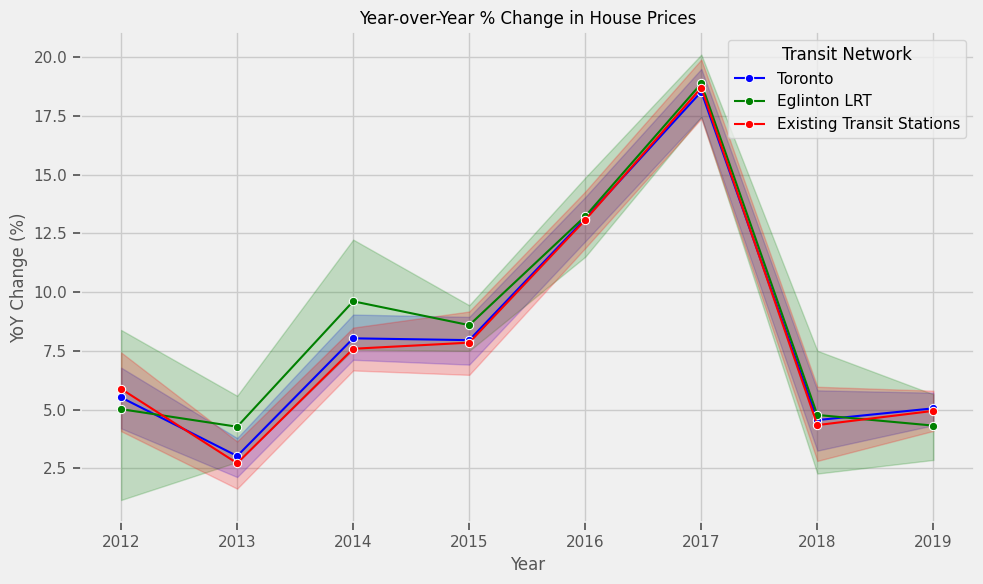

In [ ]:

# Plotting

plt.figure(figsize=(10, 6))

# Plot YoY Change for Entire Toronto Area
sns.lineplot(data=house_prices_annual_municipality, x='Year', y='YoY Change', label='Toronto', marker='o', color='blue')

# Plot YoY Change for Municipalities with Eglinton LRT
sns.lineplot(data=mean_eglinton_municipalities, x='Year', y='YoY Change', label='Eglinton LRT', marker='o', color='green')

# Plot YoY Change for Municipalities with Existing Transit Stations
sns.lineplot(data=mean_existing_municipalities, x='Year', y='YoY Change', label='Existing Transit Stations', marker='o', color='red')

# Customize the plot
plt.title('Year-over-Year % Change in House Prices')
plt.xlabel('Year')
plt.ylabel('YoY Change (%)')
plt.legend(title='Transit Network')
plt.grid(True)
plt.tight_layout()
plt.savefig('plots/YoYpercentChange.png', dpi=300)

# Show the plot
plt.show()


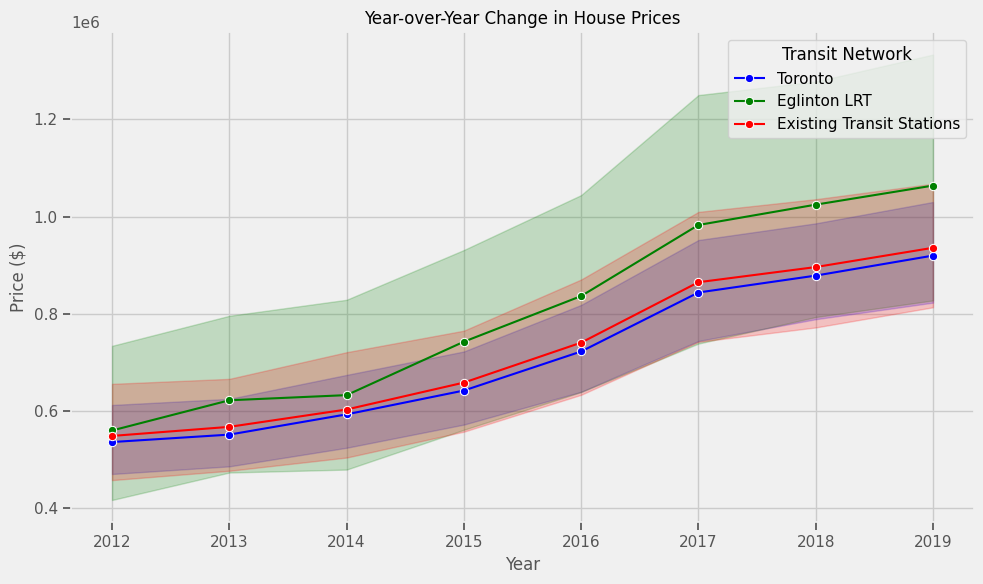

In [ ]:
# Plotting

plt.figure(figsize=(10, 6))

# Plot YoY Change for Entire Toronto Area
sns.lineplot(data=house_prices_annual_municipality, x='Year', y='Composite Benchmark', label='Toronto', marker='o', color='blue')

# Plot YoY Change for Municipalities with Eglinton LRT
sns.lineplot(data=mean_eglinton_municipalities, x='Year', y='Composite Benchmark', label='Eglinton LRT', marker='o', color='green')

# Plot YoY Change for Municipalities with Existing Transit Stations
sns.lineplot(data=mean_existing_municipalities, x='Year', y='Composite Benchmark', label='Existing Transit Stations', marker='o', color='red')

# Customize the plot
plt.title('Year-over-Year Change in House Prices')
plt.xlabel('Year')
plt.ylabel('Price ($)')
plt.legend(title='Transit Network')
plt.grid(True)
plt.tight_layout()
plt.savefig('plots/YoYpriceChange.png', dpi=300)

# Show the plot
plt.show()


In [ ]:
#create a choropleth map for each year, based on average prices per municipality

years = gdf_municipalities['Year'].unique()

# Loop through each year and create a map
for year in years:
    # Filter data for the current year
    gdf_year = gdf_municipalities[gdf_municipalities['Year'] == year]

    map_municipalities = folium.Map(location=[43.7, -79.42], zoom_start=11)
    
    # Add the choropleth layer for the current year
    folium.Choropleth(
        geo_data=gdf_year,  # GeoDataFrame with geometries
        data=gdf_year,  # DataFrame with prices (make sure the columns exist)
        columns=['Municipality', 'Composite Benchmark'],  # Price for each Municipality
        key_on='feature.properties.Municipality',  # The property to join on in the geo_data
        fill_color='YlOrRd',  # Color scale (Yellow to Red)
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name="Average House Price",
        highlight=True
    ).add_to(map_municipalities)
    
    # # Add a marker with the title for this year
    # folium.Marker(
    #     [43.7, -79.42],  # Set the marker location (center of the map)
    #     popup=f"Average House Price - {year}",
    #     icon=folium.Icon(icon='cloud', color='blue')
    # ).add_to(map_municipalities)
    
    # Save the map for this year as an HTML file
    map_municipalities.save(f"average_house_prices_{year}.html")
